## Step 1:- Import the  libraries

### Ở đây, chúng ta sẽ sử dụng Tensorflow để tạo mô hình và train. Phần lớn code theo hướng dẫn của TensorFlow. Bạn có thể sử dụng  Google Colab hoặc Kaggle nếu bạn muốn một GPU để train

In [ ]:
import string
import numpy as np
import pandas as pd
from numpy import array
from pickle import load

from PIL import Image
import pickle
from collections import Counter
import matplotlib.pyplot as plt

import sys, time, os, warnings
warnings.filterwarnings("ignore")
import re

import keras
import tensorflow as tf
from tqdm import tqdm
from nltk.translate.bleu_score import sentence_bleu

from keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from keras.utils.vis_utils import plot_model
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense, BatchNormalization
from keras.layers import LSTM
from keras.layers import Embedding
from keras.layers import Dropout
from keras.layers.merge import add
from keras.callbacks import ModelCheckpoint
from keras.preprocessing.image import load_img, img_to_array
from keras.preprocessing.text import Tokenizer
from keras.applications.vgg16 import VGG16, preprocess_input

from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd "/content/drive/MyDrive/ML"

/content/drive/MyDrive/ML


In [ ]:
cd "Final/"

/content/drive/MyDrive/ML/Final


## Step 2:- Data loading and Preprocessing

### Khai báo Image path

In [ ]:
image_path = "/content/drive/MyDrive/ML/Flicker8k_Dataset"
dir_Flickr_text = "/content/drive/MyDrive/ML/Flickr8k_text/Flickr8k.token.txt"
jpgs = os.listdir(image_path)

print("Total Images in Dataset = {}".format(len(jpgs)))

Total Images in Dataset = 16702


### Tạo 1 DataFrame để lưu trữ Image và Caption cho dễ sử dụng

In [ ]:
file = open(dir_Flickr_text,'r')
text = file.read()
file.close()

datatxt = []
for line in text.split('\n'):
    col = line.split('\t')
    if len(col) == 1:
        continue
    w = col[0].split("#")
    datatxt.append(w + [col[1].lower()])

data = pd.DataFrame(datatxt,columns=["filename","index","caption"])
data = data.reindex(columns =['index','filename','caption'])
data = data[data.filename != '2258277193_586949ec62.jpg.1']
uni_filenames = np.unique(data.filename.values)

data.head()

,index,filename,caption
0,0,1000268201_693b08cb0e.jpg,a child in a pink dress is climbing up a set o...
1,1,1000268201_693b08cb0e.jpg,a girl going into a wooden building .
2,2,1000268201_693b08cb0e.jpg,a little girl climbing into a wooden playhouse .
3,3,1000268201_693b08cb0e.jpg,a little girl climbing the stairs to her playh...
4,4,1000268201_693b08cb0e.jpg,a little girl in a pink dress going into a woo...


In [ ]:
data.filename.nunique()

8091

### Thử Visualize 5 ảnh

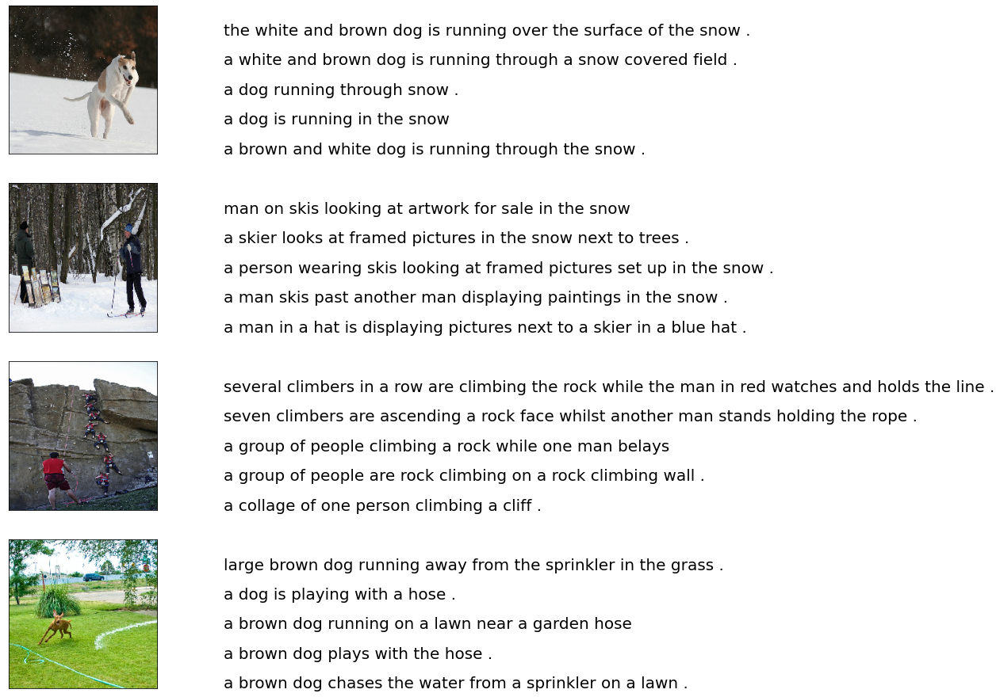

In [ ]:
npic = 5
npix = 224
target_size = (npix,npix,3)
count = 1

fig = plt.figure(figsize=(10,20))
for jpgfnm in uni_filenames[10:14]:
    filename = image_path + '/' + jpgfnm
    captions = list(data["caption"].loc[data["filename"]==jpgfnm].values)
    image_load = load_img(filename, target_size=target_size)
    ax = fig.add_subplot(npic,2,count,xticks=[],yticks=[])
    ax.imshow(image_load)
    count += 1

    ax = fig.add_subplot(npic,2,count)
    plt.axis('off')
    ax.plot()
    ax.set_xlim(0,1)
    ax.set_ylim(0,len(captions))
    for i, caption in enumerate(captions):
        ax.text(0,i,caption,fontsize=20)
    count += 1
plt.show()

### Cùng xét xem tập từ vựng:-



In [ ]:
vocabulary = []
for txt in data.caption.values:
    vocabulary.extend(txt.split())
print('Vocabulary Size: %d' % len(set(vocabulary)))

Vocabulary Size: 8918


### Tiếp theo, thực hiện một số thao tác làm sạch văn bản như xóa dấu câu, ký tự đơn và giá trị số:

In [ ]:
def remove_punctuation(text_original):
    text_no_punctuation = text_original.translate(string.punctuation)
    return(text_no_punctuation)

def remove_single_character(text):
    text_len_more_than1 = ""
    for word in text.split():
        if len(word) > 1:
            text_len_more_than1 += " " + word
    return(text_len_more_than1)

def remove_numeric(text):
    text_no_numeric = ""
    for word in text.split():
        isalpha = word.isalpha()
        if isalpha:
            text_no_numeric += " " + word
    return(text_no_numeric)

def text_clean(text_original):
    text = remove_punctuation(text_original)
    text = remove_single_character(text)
    text = remove_numeric(text)
    return(text)

for i, caption in enumerate(data.caption.values):
    newcaption = text_clean(caption)
    data["caption"].iloc[i] = newcaption

In [ ]:
def df_word_count(data,vocabulary):
    ct = Counter(vocabulary)
    appen_1 = []
    appen_2 = []
    for i in ct.keys():
        appen_1.append(i)
    for j in ct.values():
        appen_2.append(j)
    data = {"word":appen_1 , "count":appen_2}
    dfword = pd.DataFrame(data)
    dfword = dfword.sort_values(by='count', ascending=False)
    dfword = dfword.reset_index()[["word","count"]]
    return(dfword)

In [ ]:
dfwordcount = df_word_count(data,vocabulary)

In [ ]:
dfwordcount

,word,count
0,a,62986
1,.,36577
2,in,18974
3,the,18418
4,on,10743
...,...,...
8913,backflips,1
8914,bikina,1
8915,saroog,1
8916,sarongs,1


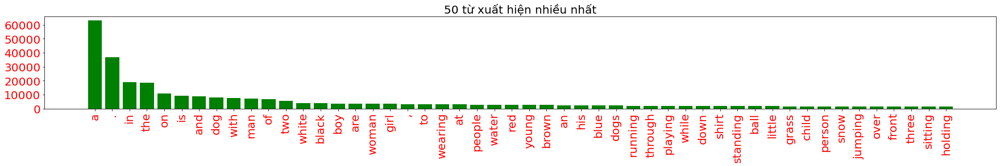

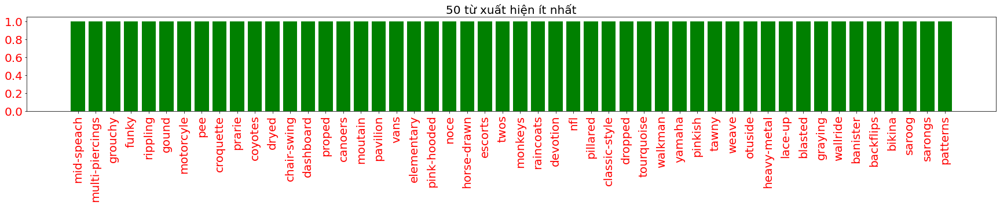

In [ ]:
topn = 50

def plthist(dfsub, title="The top 50 most frequently appearing words"):
    plt.figure(figsize=(30,3))
    plt.bar(dfsub.index,dfsub["count"],color ='g')
    plt.yticks(fontsize=20,color ='r')
    plt.xticks(dfsub.index,dfsub["word"],rotation=90,fontsize=20,color ='r')
    plt.title(title,fontsize=20)
    plt.show()

plthist(dfwordcount.iloc[:topn,:],
        title="50 từ xuất hiện nhiều nhất")
plthist(dfwordcount.iloc[-topn:,:],
        title="50 từ xuất hiện ít nhất")

### Tiếp theo, lưu tất cả các chú thích và đường dẫn hình ảnh trong 2 list để  có thể tải hình ảnh cùng một lúc bằng cách sử dụng tập hợp đường dẫn. cũng thêm thẻ ‘<start>’ và ‘<end>’ vào mỗi phụ đề để mô hình hiểu được phần bắt đầu và kết thúc của mỗi phụ đề.

In [ ]:
PATH = "/content/drive/MyDrive/ML/Flicker8k_Dataset/"
all_captions = []
for caption  in data["caption"].astype(str):
    caption = '<start> ' + caption + ' <end>'
    all_captions.append(caption)

all_captions[:10]

['<start>  child in pink dress is climbing up set of stairs in an entry way <end>',
 '<start>  girl going into wooden building <end>',
 '<start>  little girl climbing into wooden playhouse <end>',
 '<start>  little girl climbing the stairs to her playhouse <end>',
 '<start>  little girl in pink dress going into wooden cabin <end>',
 '<start>  black dog and spotted dog are fighting <end>',
 '<start>  black dog and dog playing with each other on the road <end>',
 '<start>  black dog and white dog with brown spots are staring at each other in the street <end>',
 '<start>  two dogs of different breeds looking at each other on the road <end>',
 '<start>  two dogs on pavement moving toward each other <end>']

In [ ]:
all_img_name_vector = []
for annot in data["filename"]:
    full_image_path = PATH + annot
    all_img_name_vector.append(full_image_path)

all_img_name_vector[:10]

['/content/drive/MyDrive/ML/Flicker8k_Dataset/1000268201_693b08cb0e.jpg',
 '/content/drive/MyDrive/ML/Flicker8k_Dataset/1000268201_693b08cb0e.jpg',
 '/content/drive/MyDrive/ML/Flicker8k_Dataset/1000268201_693b08cb0e.jpg',
 '/content/drive/MyDrive/ML/Flicker8k_Dataset/1000268201_693b08cb0e.jpg',
 '/content/drive/MyDrive/ML/Flicker8k_Dataset/1000268201_693b08cb0e.jpg',
 '/content/drive/MyDrive/ML/Flicker8k_Dataset/1001773457_577c3a7d70.jpg',
 '/content/drive/MyDrive/ML/Flicker8k_Dataset/1001773457_577c3a7d70.jpg',
 '/content/drive/MyDrive/ML/Flicker8k_Dataset/1001773457_577c3a7d70.jpg',
 '/content/drive/MyDrive/ML/Flicker8k_Dataset/1001773457_577c3a7d70.jpg',
 '/content/drive/MyDrive/ML/Flicker8k_Dataset/1001773457_577c3a7d70.jpg']

In [ ]:
 
print(type(im))
# <class 'numpy.ndarray'>

print(im.shape)
print(type(im.shape))

<class 'numpy.ndarray'>
(500, 375, 3)
<class 'tuple'>


### Bây giờ bạn có thể thấy chúng ta có 40455 đường dẫn và chú thích hình ảnh.

In [ ]:
print(f"len(all_img_name_vector) : {len(all_img_name_vector)}")
print(f"len(all_captions) : {len(all_captions)}")

len(all_img_name_vector) : 40455
len(all_captions) : 40455


### Chúng tôi sẽ chỉ lấy 40000 mỗi lô để chúng tôi có thể chọn kích thước lô chính xác, tức là 625 lô nếu kích thước lô = 64. Để làm điều này, chúng tôi xác định một hàm để giới hạn tập dữ liệu ở 40000 hình ảnh và chú thích.

In [ ]:
def data_limiter(num,all_captions,all_img_name_vector):
    train_captions, img_name_vector = shuffle(all_captions,all_img_name_vector,random_state=1)
    train_captions = train_captions[:num]
    img_name_vector = img_name_vector[:num]
    return train_captions,img_name_vector

train_captions,img_name_vector = data_limiter(40000,all_captions,all_img_name_vector)

## Step 3:- Tạo model


### Hãy xác định mô hình trích xuất đặc trưng hình ảnh bằng VGG16. Chúng ta phải nhớ rằng chúng ta không cần phải phân loại các hình ảnh ở đây, chúng ta chỉ cần trích xuất một vector hình ảnh cho hình ảnh của chúng ta. Do đó, chúng tôi loại bỏ lớp softmax khỏi mô hình. Tất cả chúng ta phải xử lý trước tất cả các hình ảnh có cùng kích thước, tức là 224 × 224 trước khi đưa chúng vào mô hình.

In [ ]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (224, 224))
    img = preprocess_input(img)
    return img, image_path

image_model = tf.keras.applications.VGG16(include_top=False, weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output
image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

image_features_extract_model.summary()

58900480/58889256 [==============================] - 1s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                              

### Tiếp theo, hãy Map từng tên hình ảnh với function load hình ảnh: -

In [ ]:
encode_train = sorted(set(img_name_vector))
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(64)

### Chúng tôi trích xuất các features và lưu trữ chúng trong các tệp .npy tương ứng và sau đó chuyển các tính năng đó qua encoder. Tệp NPY lưu trữ tất cả thông tin cần thiết để tạo lại một array , bao gồm thông tin về dtype and shape.

In [ ]:
%%time
for img, path in tqdm(image_dataset):
    batch_features = image_features_extract_model(img)
    batch_features = tf.reshape(batch_features,
                             (batch_features.shape[0], -1, batch_features.shape[3]))
    
    for bf, p in zip(batch_features, path):
        path_of_feature = p.numpy().decode("utf-8")
        np.save(path_of_feature, bf.numpy())

100%|██████████| 127/127 [08:36<00:00,  4.07s/it]

CPU times: user 2min 32s, sys: 10 s, total: 2min 42s
Wall time: 8min 36s


### Tiếp theo, chúng tôi tokenize và xây dựng vốn từ vựng của tất cả các từ duy nhất trong dữ liệu. Chúng tôi cũng sẽ giới hạn dung lượng từ vựng ở 5000 từ hàng đầu để tiết kiệm bộ nhớ. Chúng tôi sẽ thay thế các từ không có trong từ vựng bằng mã thông báo <una>

In [ ]:
top_k = 5000
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
                                                 oov_token="<unk>",
                                                 filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')

tokenizer.fit_on_texts(train_captions)
train_seqs = tokenizer.texts_to_sequences(train_captions)
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

train_seqs = tokenizer.texts_to_sequences(train_captions)
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')

###Hãy hình dung phần đào tạo và chú thích đệm và các vectơ được mã hóa:

In [ ]:
train_captions[:3]

['<start>  several children leaping into pile of leaves on the ground <end>',
 '<start>  man hiking in the wilderness giving the camera thumbs up <end>',
 '<start>  white dog is running through the water onto the shore <end>']

In [ ]:
train_seqs[:3]

[[2, 184, 62, 331, 64, 524, 12, 329, 6, 5, 167, 3],
 [2, 11, 588, 4, 5, 2384, 895, 5, 93, 1281, 53, 3],
 [2, 14, 9, 7, 32, 33, 5, 24, 238, 5, 280, 3]]

### Tiếp theo, chúng tôi có thể tính toán độ dài tối đa và tối thiểu của tất cả phụ đề:

In [ ]:
def calc_max_length(tensor):
    return max(len(t) for t in tensor)
max_length = calc_max_length(train_seqs)

def calc_min_length(tensor):
    return min(len(t) for t in tensor)
min_length = calc_min_length(train_seqs)

print('Max Length of any caption : Min Length of any caption = '+ str(max_length) +" : "+str(min_length))

Max Length of any caption : Min Length of any caption = 33 : 2


### Tiếp theo, Tạo tập hợp đào tạo và xác thực bằng cách sử dụng phân tách 80-20:

In [ ]:
img_name_train, img_name_val, cap_train, cap_val = train_test_split(img_name_vector,cap_vector, test_size=0.2, random_state=0)


In [ ]:
'''
# How Dataset.from_tensor_slices work
t = tf.constant([[1, 2], [3, 4]])
ds = tf.data.Dataset.from_tensor_slices(t)   # [1, 2], [3, 4]
ds # <TensorSliceDataset shapes: (2,), types: tf.int32>
'''
def create_dataset(img_name_train,caption_train):

  
  dataset = tf.data.Dataset.from_tensor_slices((img_name_train, caption_train))

  # Use map to load the numpy files in parallel
  dataset = dataset.map(lambda item1, item2: tf.numpy_function(load_npy, [item1, item2], [tf.float32, tf.int32]),num_parallel_calls=tf.data.experimental.AUTOTUNE)

  # Shuffle and batch
  dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
  return dataset

### Định nghĩa các tham số để training:

In [ ]:
BATCH_SIZE = 64
BUFFER_SIZE = 1000
embedding_dim = 256
units = 512
vocab_size = len(tokenizer.word_index) + 1
num_steps = len(img_name_train) // BATCH_SIZE
features_shape = 512
attention_features_shape = 49

###Tiếp theo, hãy tạo tập dữ liệu tf.data để sử dụng cho việc training mô hình.

In [ ]:
def map_func(img_name, cap):
    img_tensor = np.load(img_name.decode('utf-8')+'.npy')
    return img_tensor, cap
dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(
                      map_func, [item1, item2], [tf.float32, tf.int32]),
                      num_parallel_calls=tf.data.experimental.AUTOTUNE)

dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [ ]:

test_dataset = tf.data.Dataset.from_tensor_slices((img_name_val, cap_val))

# Use map to load the numpy files in parallel
test_dataset = test_dataset.map(lambda item1, item2: tf.numpy_function(
                      map_func, [item1, item2], [tf.float32, tf.int32]),
                      num_parallel_calls=tf.data.experimental.AUTOTUNE)

test_dataset = test_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
test_dataset = test_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

### Tiếp theo, định nghĩa các kiến trúc encoder-decoder với attention . Kiến trúc được xác định trong bài viết này tương tự như kiến trúc được mô tả trong bài báo “Show and Tell: A Neural Image Caption Generator”: -

### Bộ mã hóa VGG-16 được định nghĩa bên dưới: - 

In [ ]:
class VGG16_Encoder(tf.keras.Model):
    # Phần encoder passes the features qua 1 Fully connected layer

    def __init__(self, embedding_dim):
        super(VGG16_Encoder, self).__init__()
        # shape after fc == (batch_size, 49, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)
        self.dropout = tf.keras.layers.Dropout(0.5, noise_shape=None, seed=None)

    def call(self, x):
        #x= self.dropout(x)
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x 

### We define our RNN based on GPU/CPU capabilities-


In [ ]:
def rnn_type(units):
    if tf.test.is_gpu_available():
        return tf.compat.v1.keras.layers.CuDNNLSTM(units,
                                                   return_sequences=True,
                                                   return_state=True,
                                                   recurrent_initializer='glorot_uniform')
    else:
        return tf.keras.layers.GRU(units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_activation='sigmoid',
                                   recurrent_initializer='glorot_uniform')

### Tiếp theo, định nghĩa RNN Decoder với Bahdanau Attention:

In [ ]:
'''The encoder output(i.e. 'features'), hidden state(initialized to 0)(i.e. 'hidden') and
the decoder input (which is the start token)(i.e. 'x') is passed to the decoder.'''

class Rnn_Local_Decoder(tf.keras.Model):
    def __init__(self, embedding_dim, units, vocab_size):
        super(Rnn_Local_Decoder, self).__init__()
        self.units = units
        self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
        self.gru = tf.keras.layers.GRU(self.units,
                                       return_sequences=True,
                                       return_state=True,
                                       recurrent_initializer='glorot_uniform')

        self.fc1 = tf.keras.layers.Dense(self.units)

        self.dropout = tf.keras.layers.Dropout(0.5, noise_shape=None, seed=None)
        self.batchnormalization = tf.keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001, center=True, scale=True, beta_initializer='zeros', gamma_initializer='ones', moving_mean_initializer='zeros', moving_variance_initializer='ones', beta_regularizer=None, gamma_regularizer=None, beta_constraint=None, gamma_constraint=None)

        self.fc2 = tf.keras.layers.Dense(vocab_size)

        # Implementing Attention Mechanism
        self.Uattn = tf.keras.layers.Dense(units)
        self.Wattn = tf.keras.layers.Dense(units)
        self.Vattn = tf.keras.layers.Dense(1)

    def call(self, x, features, hidden):
        # features shape ==> (64,49,256) ==> Output from ENCODER
        # hidden shape == (batch_size, hidden_size) ==>(64,512)
        # hidden_with_time_axis shape == (batch_size, 1, hidden_size) ==> (64,1,512)

        hidden_with_time_axis = tf.expand_dims(hidden, 1)

        # score shape == (64, 49, 1)
        # Attention Function
        '''e(ij) = f(s(t-1),h(j))'''
        ''' e(ij) = Vattn(T)*tanh(Uattn * h(j) + Wattn * s(t))'''

        score = self.Vattn(tf.nn.tanh(self.Uattn(features) + self.Wattn(hidden_with_time_axis)))

        # self.Uattn(features) : (64,49,512)
        # self.Wattn(hidden_with_time_axis) : (64,1,512)
        # tf.nn.tanh(self.Uattn(features) + self.Wattn(hidden_with_time_axis)) : (64,49,512)
        # self.Vattn(tf.nn.tanh(self.Uattn(features) + self.Wattn(hidden_with_time_axis))) : (64,49,1) ==> score

        # you get 1 at the last axis because you are applying score to self.Vattn
        # Then find Probability using Softmax
        '''attention_weights(alpha(ij)) = softmax(e(ij))'''

        attention_weights = tf.nn.softmax(score, axis=1)

        # attention_weights shape == (64, 49, 1)
        # Give weights to the different pixels in the image
        ''' C(t) = Summation(j=1 to T) (attention_weights * VGG-16 features) '''

        context_vector = attention_weights * features
        context_vector = tf.reduce_sum(context_vector, axis=1)

        # Context Vector(64,256) = AttentionWeights(64,49,1) * features(64,49,256)
        # context_vector shape after sum == (64, 256)
        # x shape after passing through embedding == (64, 1, 256)

        x = self.embedding(x)
        # x shape after concatenation == (64, 1,  512)

        x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)
        # passing the concatenated vector to the GRU

        output, state = self.gru(x)
        # shape == (batch_size, max_length, hidden_size)

        x = self.fc1(output)
        # x shape == (batch_size * max_length, hidden_size)

        x = tf.reshape(x, (-1, x.shape[2]))

        # Adding Dropout and BatchNorm Layers
        x= self.dropout(x)
        x= self.batchnormalization(x)

        # output shape == (64 * 512)
        x = self.fc2(x)

        # shape : (64 * 8329(vocab))
        return x, state, attention_weights

    def reset_state(self, batch_size):
        return tf.zeros((batch_size, self.units))


encoder = VGG16_Encoder(embedding_dim)
decoder = Rnn_Local_Decoder(embedding_dim, units, vocab_size)

### Tiếp theo, định nghĩa hàm loss và optimizers:-

In [ ]:
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction='none')

def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)
    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask

    return tf.reduce_mean(loss_)

**CHECK POINT SAVING để load sau này**

In [ ]:
checkpoint_path_ckpt = "/content/drive/MyDrive/ML/checkpoint/train"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path_ckpt, max_to_keep=5)

Start checkpointing from the checkpoint last saved

In [ ]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])

**Tensorboard Setup**

In [ ]:
# Clear previous logs
!rm -rf ./logs/ 


# Define our metrics
train_loss = tf.keras.metrics.Mean('train_loss', dtype=tf.float32)
# train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy('train_accuracy')

import datetime
current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
train_log_dir = 'logs/gradient_tape/' + current_time + '/train'
test_log_dir = 'logs/gradient_tape/' + current_time + '/test'
train_summary_writer = tf.summary.create_file_writer(train_log_dir)
test_summary_writer = tf.summary.create_file_writer(test_log_dir)

## Step 4:- Model Training

###### Tiếp theo, training.

In [ ]:
# loss_plot = []

# @tf.function
# def train_step(img_tensor, target):
#     loss = 0
#     # initializing the hidden state for each batch
#     # because the captions are not related from image to image

#     hidden = decoder.reset_state(batch_size=target.shape[0])
#     dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * BATCH_SIZE, 1)

#     with tf.GradientTape() as tape:
#         features = encoder(img_tensor)
#         for i in range(1, target.shape[1]):
#              # passing the features through the decoder
#             predictions, hidden, _ = decoder(dec_input, features, hidden)
#             loss += loss_function(target[:, i], predictions)

#             # using teacher forcing
#             dec_input = tf.expand_dims(target[:, i], 1)

#     total_loss = (loss / int(target.shape[1]))
#     trainable_variables = encoder.trainable_variables + decoder.trainable_variables
#     gradients = tape.gradient(loss, trainable_variables)
#     optimizer.apply_gradients(zip(gradients, trainable_variables))

#     return loss, total_loss



loss_plot = []

@tf.function
def train_step(img_tensor, target):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * BATCH_SIZE, 1)

  with tf.GradientTape() as tape:
      features = encoder(img_tensor)

      for i in range(1, target.shape[1]):
          # passing the features through the decoder
          #dec_input = tf.expand_dims(target[:, i], 1)
          predictions, hidden, _ = decoder(dec_input, features, hidden)

          loss += loss_function(target[:, i], predictions)

          # using teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)
          

  total_loss = (loss / int(target.shape[1]))

  trainable_variables = encoder.trainable_variables + decoder.trainable_variables

  gradients = tape.gradient(loss, trainable_variables)

  optimizer.apply_gradients(zip(gradients, trainable_variables))

  #train_loss(loss)
  #train_accuracy(target, predictions)

  return loss, total_loss

In [ ]:
test_loss_plot = []

@tf.function
def test_step(img_tensor, target):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * BATCH_SIZE, 1)

  features = encoder(img_tensor)

  for i in range(1, target.shape[1]):
      # passing the features through the decoder

      
      predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
      # predictions : (64,8329)
      loss += loss_function(target[:, i], predictions)
      
      predicted_id = tf.argmax(predictions[0])
      dec_input = tf.expand_dims([predicted_id]*BATCH_SIZE, 1)
 

  total_loss = (loss / int(target.shape[1]))

  return loss, total_loss

### Next, we train the model:-

In [ ]:
# https://github.com/tensorflow/models/issues/9706#issuecomment-877788105

In [ ]:
# EPOCHS = 20
# start_epoch = 0
# for epoch in range(start_epoch, EPOCHS):
#     start = time.time()
#     total_loss = 0

#     for (batch, (img_tensor, target)) in enumerate(dataset):
#         batch_loss, t_loss = train_step(img_tensor, target)
#         total_loss += t_loss

#         if batch % 100 == 0:
#             print ('Epoch {} Batch {} Loss {:.4f}'.format(
#                    epoch + 1, batch, batch_loss.numpy() / int(target.shape[1])))

#     # storing the epoch end loss value to plot later
#     loss_plot.append(total_loss / num_steps)

#     print ('Epoch {} Loss {:.6f}'.format(epoch + 1,
#                                          total_loss/num_steps))

#     print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))



for epoch in range(start_epoch, 20):
    start = time.time()

    #For Train
    #================================================================
    total_loss_train = 0
    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss_train += t_loss
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss_train / num_steps)

    # Tensorboard 
    with train_summary_writer.as_default():
      tf.summary.scalar('LossPlotTrain', (total_loss_train/ num_steps), step=epoch)
      tf.summary.scalar('Train_loss', train_loss.result(), step=epoch)

    #For Test
    #================================================================
    total_loss_test = 0
    for (batch, (img_tensor, target)) in enumerate(test_dataset):
        batch_loss, t_loss = test_step(img_tensor, target)
        total_loss_test += t_loss
    # storing the epoch end loss value to plot later
    test_loss_plot.append(total_loss_test / num_steps) 

    # Tensorboard 
    with test_summary_writer.as_default():
      tf.summary.scalar('LossPlotTest', (total_loss_test/ num_steps), step=epoch)

    
    if epoch % 5 == 0:
      ckpt_manager.save()

    print ('Epoch {} TrainLoss {:.6f} TestLoss {:.6f}'.format(epoch + 1,(total_loss_train/num_steps),(total_loss_test/num_steps)))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))

Epoch 3 TrainLoss 1.464207 TestLoss 0.493625
Time taken for 1 epoch 268.903023481369 sec

Epoch 4 TrainLoss 1.120937 TestLoss 0.494004
Time taken for 1 epoch 187.06959462165833 sec

Epoch 5 TrainLoss 1.002805 TestLoss 0.490598
Time taken for 1 epoch 186.94435048103333 sec

Epoch 6 TrainLoss 0.919171 TestLoss 0.506529
Time taken for 1 epoch 186.74328231811523 sec

Epoch 7 TrainLoss 0.852153 TestLoss 0.517989
Time taken for 1 epoch 188.93129181861877 sec

Epoch 8 TrainLoss 0.793368 TestLoss 0.517503
Time taken for 1 epoch 185.98857164382935 sec

Epoch 9 TrainLoss 0.742974 TestLoss 0.524716
Time taken for 1 epoch 186.87581157684326 sec

Epoch 10 TrainLoss 0.697611 TestLoss 0.540521
Time taken for 1 epoch 185.93991661071777 sec

Epoch 11 TrainLoss 0.656752 TestLoss 0.545110
Time taken for 1 epoch 186.39546871185303 sec

Epoch 12 TrainLoss 0.620493 TestLoss 0.559260
Time taken for 1 epoch 186.26709151268005 sec

Epoch 13 TrainLoss 0.587885 TestLoss 0.577478
Time taken for 1 epoch 187.835823

**Tensorboard running**

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs/gradient_tape

<IPython.core.display.Javascript object>

In [ ]:
ckpt_manager.checkpoints

ckpt.restore('/content/drive/MyDrive/ML/checkpoint/train/ckpt-4')

### Let’s plot the error graph:

In [ ]:
# plt.plot(loss_plot)
# plt.xlabel('Epochs')
# plt.ylabel('Loss')
# plt.title('Loss Plot')
# plt.show()

No handles with labels found to put in legend.


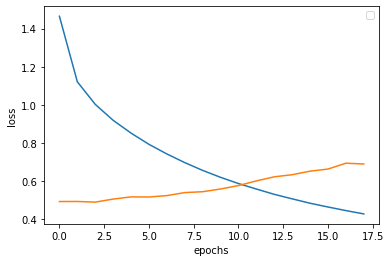

In [ ]:
for label in [loss_plot,test_loss_plot]:
    plt.plot(label)
plt.legend()
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

## Step 5:- Greedy Search và BLEU Score

###  greedy method để xác dịnh captions:


In [ ]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)
    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()
        predicted_id = tf.argmax(predictions[0]).numpy()
        result.append(tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot

        dec_input = tf.expand_dims([predicted_id], 0)
    attention_plot = attention_plot[:len(result), :]

    return result, attention_plot

In [ ]:
from tensorflow.keras.models import load_model

In [ ]:
from keras.models import Sequential
autoencoder = Sequential([encoder, decoder])

In [ ]:
class AutoEncoder(keras.Model):
    def __init__(self, encoder, decoder):
        super(AutoEncoder, self).__init__()
        self.encoder = encoder
        self.decoder = decoder

    def call(self, inputs, training=None, **kwargs):
        x = self.encoder(inputs)
        x = self.decoder(x)
        return x


ae = AutoEncoder(encoder, decoder)

### Ngoài ra, chúng ta xác định một hàm để làm rõ hơn cơ chế attention khi sinh ra từ mới

In [ ]:
def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))
    fig = plt.figure(figsize=(10, 10))
    len_result = len(result)
    for l in range(len_result):
        temp_att = np.resize(attention_plot[l], (8, 8))
        ax = fig.add_subplot(len_result//2, len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()

### thử nào

BELU score: 50.138404778620725
Real Caption: little girl jumps into the arms of her mother standing in pool
Prediction Caption: little girl catches ball in the air into the water


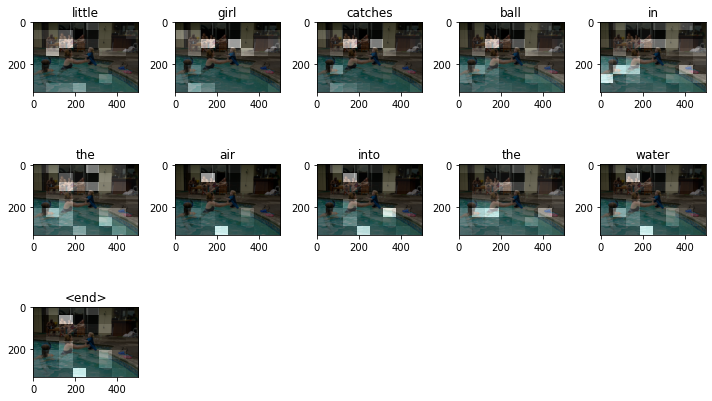

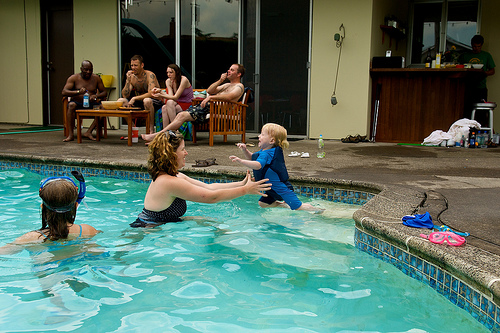

In [ ]:
# captions on the validation set
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]

result, attention_plot = evaluate(image)

# remove <start> and <end> from the real_caption
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

#remove <end> from result        
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result

score = sentence_bleu(reference, candidate)
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)
plot_attention(image, result, attention_plot)
Image.open(img_name_val[rid])

### có thể thấy mô hình có thể tạo phụ đề giống như phụ đề thực. Hãy thử xem một số hình ảnh khác từ bộ test

Real Caption: little boy is playing in the water with beautiful sunset and mountains in the background
Prediction Caption: the child is splashing in the water
BELU score: 0


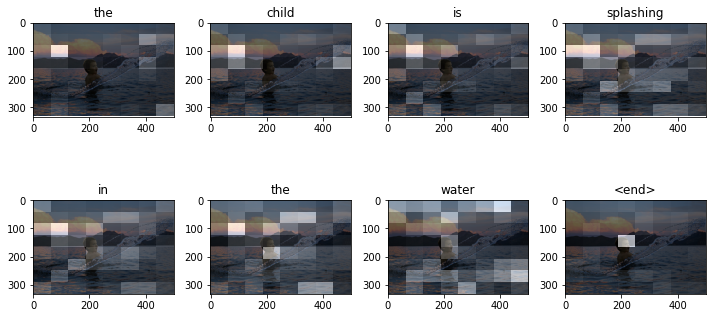

time took to Predict: 2 sec


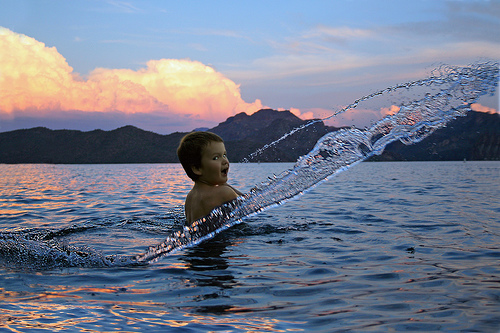

In [ ]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
result, attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)

#remove <end> from result        
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)
score = sentence_bleu(reference, candidate)
print(f"BELU score: {score*100}")
plot_attention(image, result, attention_plot)
print(f"time took to Predict: {round(time.time()-start)} sec")

Image.open(img_name_val[rid])

BELU score: 63.89431042462724
Real Caption: african american stands by his car
Prediction Caption: man stands at black suv
BELU score: 63.89431042462724


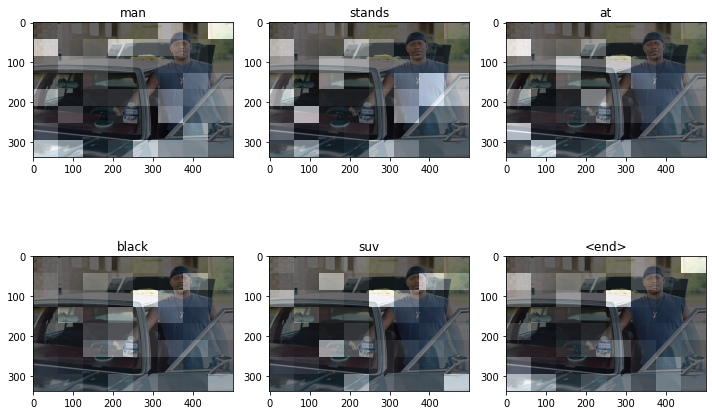

time took to Predict: 1890 sec


In [ ]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]

real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
result, attention_plot = evaluate(image)

# remove <start> and <end> from the real_caption
first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

#remove <end> from result        
result_join = ' '.join(result)
result_final = result_join.rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result

score = sentence_bleu(reference, candidate)
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)
score = sentence_bleu(reference, candidate)
print(f"BELU score: {score*100}")
plot_attention(image, result, attention_plot)
Image.open(img_name_val[rid])
print(f"time took to Predict: {round(time.time()-start)} sec")

### Here we can see our caption defines the image better than one of the real captions.

### And there it is!  We have successfully implemented the Attention Mechanism for generating Image Captions

## Kết Luận 

Tự động chú thích hình ảnh còn lâu mới hoàn thiện và có rất nhiều dự án nghiên cứu đang thực hiện nhằm mục đích trích xuất đặc điểm hình ảnh chính xác hơn và tạo câu tốt hơn về mặt ngữ nghĩa. Chúng tôi đã hoàn thành thành công những gì chúng tôi đã đề cập trong đề xuất, nhưng sử dụng tập dữ liệu nhỏ hơn (Flickr8k) do khả năng tính toán hạn chế. Có thể có những cải tiến tiềm năng nếu có thêm thời gian. Trước hết, chúng tôi đã trực tiếp sử dụng mạng CNN được đào tạo trước như một phần của đường dẫn mà không cần tinh chỉnh, vì vậy mạng không thích ứng với tập dữ liệu đào tạo cụ thể này. Do đó, bằng cách thử nghiệm với các mạng CNN khác nhau được đào tạo trước và cho phép tinh chỉnh, chúng tôi hy vọng sẽ đạt được điểm cao hơn một chút. Một cải tiến tiềm năng khác là đào tạo về sự kết hợp của Flickr8k, Flickr30k và MSCOCO. Nói chung, mạng càng có nhiều tập dữ liệu đào tạo đa dạng thì kết quả đầu ra càng chính xác. Tất cả chúng tôi đều đồng ý rằng dự án này khơi dậy sự quan tâm của chúng tôi đối với việc áp dụng kiến thức Học máy trong Thị giác Máy tính và hy vọng sẽ khám phá nhiều hơn nữa trong tương lai.

## End

In [ ]:
# captions on the validation set
scores = list()  
for rid in range (len(img_name_val)):
  image = img_name_val[rid]

  result, attention_plot = evaluate(image)

  # remove <start> and <end> from the real_caption
  real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
  first = real_caption.split(' ', 1)[1]
  real_caption = first.rsplit(' ', 1)[0]

  #remove "<unk>" in result
  for i in result:
      if i=="<unk>":
          result.remove(i)

  for i in real_caption:
      if i=="<unk>":
          real_caption.remove(i)

  #remove <end> from result        
  result_join = ' '.join(result)
  result_final = result_join.rsplit(' ', 1)[0]

  real_appn = []
  real_appn.append(real_caption.split()) 
  reference = real_appn
  candidate = result

  score = sentence_bleu(reference, candidate)
  scores.append(score)
print(" BLEU socre for all val image:",sum(scores) / len(scores))
# run: 36' 20''

 BLEU socre for all val image: 0.3906584935126492
